<a href="https://colab.research.google.com/github/nuo24/web_crawler/blob/main/INFO_442_Group_2_Final_Deliverable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### College of Computing and Informatics, Drexel University
### INFO 442: Data Science Projects
---

## Brain Tumor Detection Model Project

## Nathan Okolo, Allen Cai, Joey Hermann, Muneera Cadersa,

#### Date: 8/28/2022

---

## Abstract

This project focuses on detecting brain tumor using deep learning techniques. Brain tumor is usually detected using Magnetic Resonance Imaging (MRI) scans. Those scans allow us to identify any abnormal brain tissue growth. We plan to use our model to detect brain tumor using Machine Learning & Deep Learning techniques from MRI scans, improve the diagnosis of brain tumor, eliminating human error (radiologist who didn't diagnose a tumor), and provide physicians with second opinions to increase confidence in tumor diagnosis, hence resulting in more accurate treatment.   

## Story (narrated by Muneera)
The reason why we chose to go ahead with this project is because of a personal story. When I was 7 years old my mom was diagnosed with brain cancer. It was an absolutely difficult time for my family and I, part of the reason being lack of health care in that field at that time. There were very few oncologists were able to diagnose and treat brain cancer. We were very anxious about my mother's recovery due to that reason. She had to leave the country and go to UK to get treated. Hence, we chose to work on this project with the objective of bridging the gap between technology and medical care. This will potentially reduce medical errors and allow for more accurate diagnosis. It can also serve as a second opinion for oncologists. Hence patients have more confidence in the healthcare system.

## Dataset Description

The dataset that we are using is the LGG Segmentation (Lower-Grade Glioma) dataset on Kaggle. It contains data collected by researchers for a 2019 study with the intention of creating an automatic way to quantify lower-grade glioma tumor characteristics utilizing deep learning and test if these characteristics are predictive of a tumor’s genomic subtypes. They obtained the data from The Cancer Genome Atlas (TCGA) and The Cancer Imaging Archive (TCIA), selecting 110 patients from the TCGA lower-grade glioma collection with pre-operative imaging data containing at least a fluid-attenuated inversion recovery (FLAIR) sequence. The MRI images corresponding to each patient were retrieved from TCIA. For each slice, a mask was created via a researcher drawing an outline of the FLAIR abnormality on each slice (for creating training data).  

The dataset is made up of 110 directories, one for each patient, containing the respective patient’s MRIs and masks (.tif format) as well as a csv file with genomic data called data.csv. At this point we do not have a data dictionary for data.csv, so we are excluding it. More context is needed for us non-medical people to understand what it means. We may email the original creator of the dataset SHOULD we end up wanting to use it.

The researchers performed preprocessing on the data for their study, meaning that there is not much of that for us to do ourselves. Their preprocessing consisted of these steps (retrieved from study section 3.2):
1. Scaling of the images to the common frame of reference.
2. Removal of the skull to focus the analysis on the brain region (a.k.a., skull stripping)
3. Adaptive window and level adjustment based on the image histogram
to normalize intensities of tissues between cases.
4. Z-score normalization of the entire data set.

Link to dataset: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation

Link to study: https://www.clinicalkey.com/#!/content/playContent/1-s2.0-S0010482519301520?returnurl=https:%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0010482519301520%3Fshowall%3Dtrue&referrer=https:%2F%2Fwiki.cancerimagingarchive.net%2F

# IMPORTING LIBRARIES AND CREATING SORTED DATAFRAMES

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import cv2
from skimage import io

import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import tensorflow.keras.backend as K

import random
import glob
from sklearn.preprocessing import StandardScaler, normalize
from IPython.display import display

In [ ]:
try:
    data = pd.read_csv(r"C:\Users\Allen\Desktop\brain_tumor_data\lgg-mri-segmentation\kaggle_3m\data.csv")
    data.info()
except Exception:
    pass

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [ ]:
data.head(10)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


In [ ]:
# Extracting the paths for all of the images and appending them to a list
# RERAN AFTER CREATING CONTRAST ADDED IMAGES TO INCLUDE THEM IN THE DATASET AS WELL

data_map = []
for sub_dir_path in glob.glob("lgg-mri-segmentation\\kaggle_3m\\*"):
    #if os.path.isdir(sub_path_dir):
    try:
        dir_name = sub_dir_path.split('\\')[-1]
        for filename in os.listdir(sub_dir_path):
            image_path = sub_dir_path + '\\' + filename
            data_map.extend([dir_name, image_path])
    except Exception as e:
        print(e)

[WinError 267] The directory name is invalid: 'lgg-mri-segmentation\\kaggle_3m\\data.csv'
[WinError 267] The directory name is invalid: 'lgg-mri-segmentation\\kaggle_3m\\README.md'


In [ ]:
# Categorizing the different paths and text to structure them into lists

images = data_map[1::2]

patient_ids = []
originals = []
masks = []
contrast_added = []

for image_path in images:
    if "CONTRAST" in image_path:
        contrast_added.append(image_path)
    elif "mask" in image_path:
        masks.append(image_path)
    else:
        originals.append(image_path)
        patient_id = image_path.split('\\')[-2]
        patient_ids.append(patient_id)

In [ ]:
brain_df = pd.DataFrame({"patient_id" : patient_ids,
                   "original_image_path" : originals,
                   "contrast_added_path": contrast_added,
                   "mask_path": masks})
brain_df.head()

,patient_id,original_image_path,contrast_added_path,mask_path
0,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...
1,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...
2,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...
3,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...
4,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...


In [ ]:
# Diagnosis 0 = no tumor, 1 = yes tumor
# If any color at all is found in the mask, that means a tumor was detected.
def pos_neg_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 :
        return 1
    else:
        return 0

brain_df['diagnosis'] = brain_df['mask_path'].apply(lambda x: pos_neg_diagnosis(x))
brain_df

,patient_id,original_image_path,contrast_added_path,mask_path,diagnosis
0,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,0
1,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,1
2,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,1
3,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,1
4,TCGA_CS_4941_19960909,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,lgg-mri-segmentation\kaggle_3m\TCGA_CS_4941_19...,1
...,...,...,...,...,...
3924,TCGA_HT_A61B_19991127,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,0
3925,TCGA_HT_A61B_19991127,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,0
3926,TCGA_HT_A61B_19991127,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,0
3927,TCGA_HT_A61B_19991127,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,lgg-mri-segmentation\kaggle_3m\TCGA_HT_A61B_19...,0


# DATA VISUALIZATION

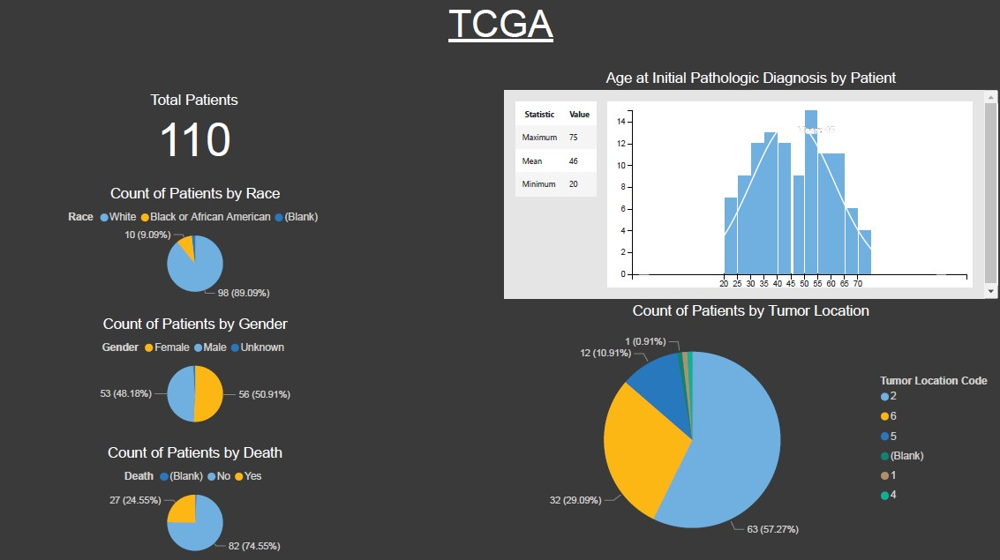

As the dataset that we are working with is comprised of images that have already been pre-processed, we were limited in what kinds of exploratory data analysis we could perform. Though we aren't using data.csv for anything else in this project, it was useful for visualizing the patients. As described earlier, each row in data.csv corresponds to one of the patient directories. We took that demographic data and used it to create visuals in Microsoft Power BI (screenshot above).

Upon identifying the field "tumor_location" and seeing the distribution in the visual, we wanted to see if that data would be of any use. To do this we took MRI images from patients with the corresponding tumor location codes and compared them. There was some variation among the results, so we broke them down further. One page was created for each of the 5 programs (TCGA-CS, TCGA-DU, TCGA-EZ, TCGA-FG, TCGA-HT) and the MRI images corresponding to those tumor codes were compared against others in the same program. Still, there was variation between the codes. The genome data for each patient in data.csv was useless for us, as we were unable to find a data dictionary or explanation of the genomic codes.

In [ ]:
brain_df['diagnosis'].value_counts()

0    2556
1    1373
Name: diagnosis, dtype: int64

### Our dataset contains 2556 MRI images of Brains without any tumors, and 1373 MRI images of Brains with tumors

In [ ]:
import plotly.graph_objects as go  # using plotly to create interactive plots

fig = go.Figure([go.Bar(x=brain_df['diagnosis'].value_counts().index,
                        y=brain_df['diagnosis'].value_counts(),
                        width=[.4, .4]
                       )
                ])
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=4, opacity=0.4
                 )
fig.update_layout(title_text="Diagnosis Count Plot",
                  width=700,
                  height=550,
                  yaxis=dict(
                             title_text="Count",
                             tickmode="array",
                             titlefont=dict(size=20)
                           )
                 )
fig.update_yaxes(automargin=True)
fig.show()

### Read in and view images with CV2

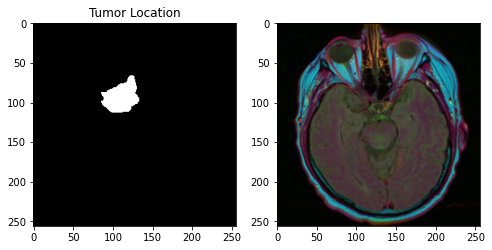

In [ ]:
for i in range(len(brain_df)):
    if cv2.imread(brain_df.mask_path[i]).max() > 0:
        break

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(cv2.imread(brain_df.mask_path[i]));
plt.title('Tumor Location')

plt.subplot(1,2,2)
plt.imshow(cv2.imread(brain_df.original_image_path[i]));

# plt.subplot(1,2,2)
# plt.imshow(cv2.imread(brain_df.contrast_added_path[i]));

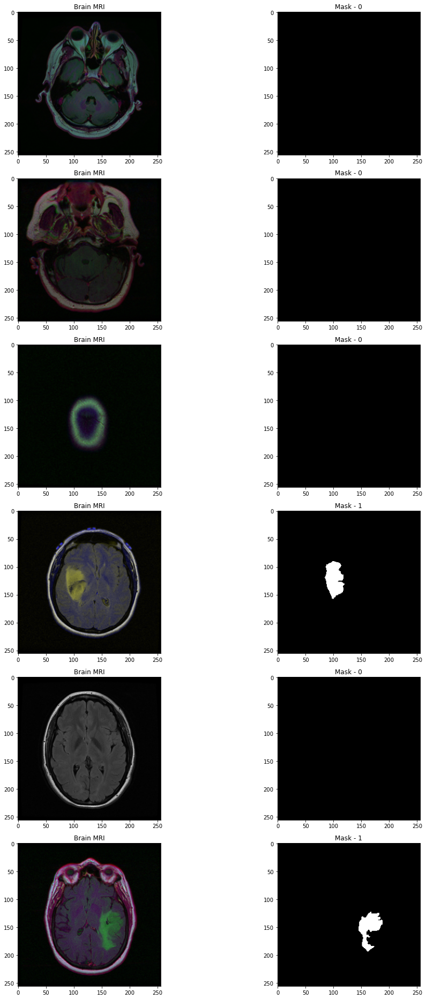

In [ ]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately

fig, axs = plt.subplots(6,2, figsize=(16,26))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.original_image_path[i])) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['diagnosis'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

## Preprocessing Steps

As you can see in the outputted images above, for the most part the main dataset we're using is already cleaned. Most of the typical image processing techniques like resizing the images, rotating them, bluring/sharpening the image quality, and normalizing the sizes were either already done for us by the creators of the dataset or just seem unneccessary.

One thing we did notice though was that the images were sometimes quite murky and dark, and the colors tended to blend in with each other. To rectify this and make it easier on our models to detect tumors in the MRIs, we decided to try increasing the contrast and brightness of each of the MRI scans. This helps the radiologist have better insight into how the tumour actually appears and can help significantly in making judgments.

In [ ]:
## Code we used to generate new versions of the MRI scans with higher contrast and brightness, then save to the same folders
## All of this is commented out to avoid rerunning this multi hour process each time we reload our notebook

# for image_path in brain_df['original_image_path']:
#     image_array = cv2.imread(cv2.samples.findFile(image_path))
#     alpha = 3.0 # Simple contrast control
#     beta = 10    # Simple brightness control

#     patient_id = image_path.split('\\')[-2]
#     image_id = image_path.split('\\')[-1]

#     new_image = np.zeros(image_array.shape, image_array.dtype)

#     for y in range(image_array.shape[0]):
#         for x in range(image_array.shape[1]):
#             for c in range(image_array.shape[2]):
#                 new_image[y,x,c] = np.clip(alpha*image_array[y,x,c] + beta, 0, 255)

#     cv2.imwrite(r'C:\Users\Allen\Desktop\brain_tumor_data\lgg-mri-segmentation\kaggle_3m\{}\{}_CONTRAST.tif'.format(patient_id, image_id), new_image)

### BEFORE ADDING CONTRAST TO THE MRI SCANS (ORIGINAL IMAGES)

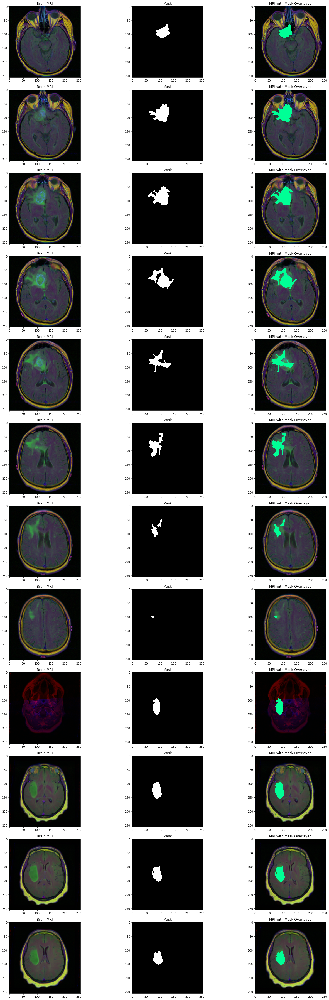

In [ ]:
import imagecodecs

count = 0
i = 0
fig,axs = plt.subplots(12,3, figsize=(20,50))
for diagnosis in brain_df['diagnosis']:
    if (diagnosis==1):
        img = io.imread(brain_df.original_image_path[i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        diagnosis = io.imread(brain_df.mask_path[i])
        axs[count][1].title.set_text("Mask")
        axs[count][1].imshow(diagnosis, cmap='gray')

        img[diagnosis==255] = (0,255,150)  # change pixel color at the position of diagnosis
        axs[count][2].title.set_text("MRI with Mask Overlayed")
        axs[count][2].imshow(img)
        count +=1
    i += 1
    if (count==12):
        break

fig.tight_layout()

### AFTER ADDING CONTRAST TO THE MRI SCANS

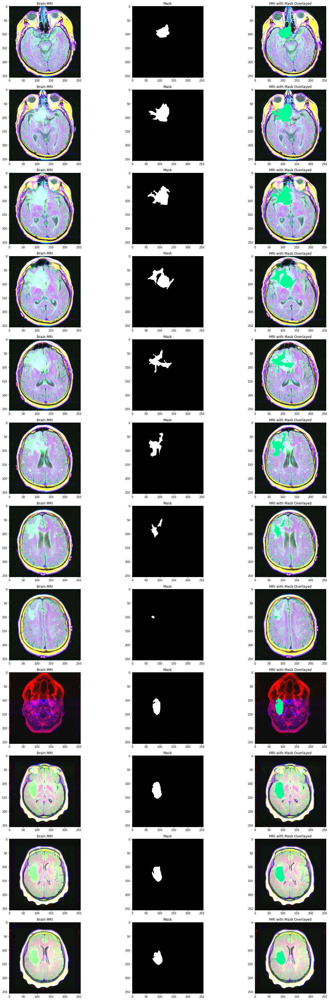

In [ ]:
count = 0
i = 0
fig,axs = plt.subplots(12,3, figsize=(20,50))
for diagnosis in brain_df['diagnosis']:
    if (diagnosis==1):
        img = io.imread(brain_df.contrast_added_path[i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        diagnosis = io.imread(brain_df.mask_path[i])
        axs[count][1].title.set_text("Mask")
        axs[count][1].imshow(diagnosis, cmap='gray')

        img[diagnosis==255] = (0,255,150)  # change pixel color at the position of diagnosis
        axs[count][2].title.set_text("MRI with Mask Overlayed")
        axs[count][2].imshow(img)
        count +=1
    i += 1
    if (count==12):
        break

fig.tight_layout()

# ResNet50 Classification Model

A ResNet50 model is a convolutional neural network that is 50 layers deep. The network can train more than one million images from the ImageNet Database. The pretrained network can classify images into 100 object categories. Hence the network is familiar with rich feature representations. A Residual Neural Network (ResNet) is also an Artificial Neural Network (ANN) of a kind that stacks residual blocks on top of each other to form a network. We will we applying one here to serve as a classifier for the MRIs - sorting them into 2 classes, Tumor or No Tumor. This serves as a simple detection system which medical professionals can load MRI images into to detect tumors that may not be so obvious to the naked eye, and/or provide a second opinion that reduces false negatives in diagnoses of tumors.

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
clf_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256,256,3)))
clf_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [ ]:
head = clf_model.output
head = AveragePooling2D(pool_size=(4,4))(head)
head = Flatten(name='Flatten')(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(2, activation='softmax')(head)

model = Model(clf_model.input, head)
model.compile(loss = 'categorical_crossentropy',
              optimizer='adam',
              metrics= ["accuracy"]
             )
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [ ]:
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15
                             )
checkpointer = ModelCheckpoint(filepath="clf-resnet-weights.hdf5",
                               verbose=1,
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

In [ ]:
h = model.fit(train_generator,
              steps_per_epoch= train_generator.n // train_generator.batch_size,
              epochs = 50,
              validation_data= valid_generator,
              validation_steps= valid_generator.n // valid_generator.batch_size,
              callbacks=[checkpointer, earlystopping])

Epoch 1/50
187/187 [==============================] - ETA: 0s - loss: 0.7076 - accuracy: 0.7639
Epoch 1: val_loss improved from inf to 7.54836, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 1521s 8s/step - loss: 0.7076 - accuracy: 0.7639 - val_loss: 7.5484 - val_accuracy: 0.6344
Epoch 2/50
187/187 [==============================] - ETA: 0s - loss: 0.3627 - accuracy: 0.8508 
Epoch 2: val_loss improved from 7.54836 to 0.66520, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 3864s 21s/step - loss: 0.3627 - accuracy: 0.8508 - val_loss: 0.6652 - val_accuracy: 0.6281
Epoch 3/50
187/187 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.8766
Epoch 3: val_loss improved from 0.66520 to 0.66080, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 1720s 9s/step - loss: 0.3087 - accuracy: 0.8766 - val_loss: 0.6608 - val_accuracy: 0.6344
Epoch 4/50
187/187 [===================

187/187 [==============================] - 1364s 7s/step - loss: 0.0669 - accuracy: 0.9796 - val_loss: 0.3506 - val_accuracy: 0.9156
Epoch 30/50
187/187 [==============================] - ETA: 0s - loss: 0.0510 - accuracy: 0.9819
Epoch 30: val_loss did not improve from 0.18725
187/187 [==============================] - 1362s 7s/step - loss: 0.0510 - accuracy: 0.9819 - val_loss: 0.4395 - val_accuracy: 0.9250
Epoch 31/50
187/187 [==============================] - ETA: 0s - loss: 0.0728 - accuracy: 0.9786
Epoch 31: val_loss did not improve from 0.18725
187/187 [==============================] - 1363s 7s/step - loss: 0.0728 - accuracy: 0.9786 - val_loss: 0.2220 - val_accuracy: 0.9406
Epoch 32/50
187/187 [==============================] - ETA: 0s - loss: 0.0551 - accuracy: 0.9839
Epoch 32: val_loss did not improve from 0.18725
187/187 [==============================] - 1362s 7s/step - loss: 0.0551 - accuracy: 0.9839 - val_loss: 0.2232 - val_accuracy: 0.9531
Epoch 33/50
187/187 [============

In [ ]:
# saving model achitecture in json file
model_json = model.to_json()
with open("clf-resnet-model.json", "w") as json_file:
    json_file.write(model_json)

In [ ]:
from keras_preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255., validation_split=0.1)

train_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='contrast_added_path',
                                              y_col='diagnosis',
                                              subset='training',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
valid_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='contrast_added_path',
                                              y_col='diagnosis',
                                              subset='validation',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(test,
                                                  directory='./',
                                                  x_col='contrast_added_path',
                                                  y_col='diagnosis',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  shuffle=False,
                                                  target_size=(256,256)
                                                 )

Found 3006 validated image filenames belonging to 2 classes.
Found 333 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size=0.15)

In [ ]:
brain_df_train = brain_df.drop(columns=['patient_id'])
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
brain_df_train['diagnosis'] = brain_df_train['diagnosis'].apply(lambda x: str(x))
try:
    brain_df_train.info()
except Exception:
    pass

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   original_image_path  3929 non-null   object
 1   contrast_added_path  3929 non-null   object
 2   mask_path            3929 non-null   object
 3   diagnosis            3929 non-null   object
dtypes: object(4)
memory usage: 122.9+ KB


# CLASSIFICATION MODEL EVALUATION

In [ ]:
h.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

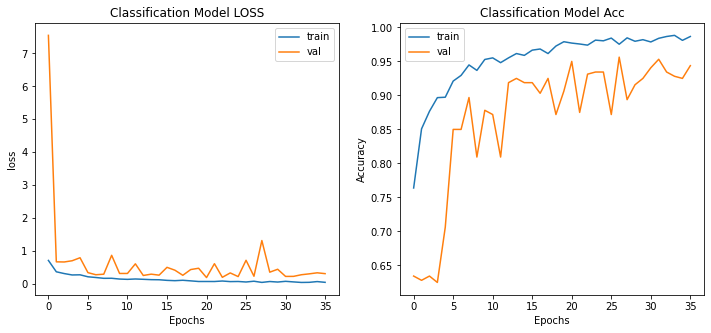

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("Classification Model LOSS");
plt.ylabel("loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['accuracy']);
plt.plot(h.history['val_accuracy']);
plt.title("Classification Model Acc");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [ ]:
_, acc = model.evaluate(test_generator)
print("Test accuracy : {} %".format(acc*100))

37/37 [==============================] - 58s 2s/step - loss: 0.1929 - accuracy: 0.9458
Test accuracy : 94.57626938819885 %


37/37 [==============================] - 59s 2s/step
0.9457627118644067
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       393
           1       0.94      0.90      0.92       197

    accuracy                           0.95       590
   macro avg       0.94      0.93      0.94       590
weighted avg       0.95      0.95      0.95       590



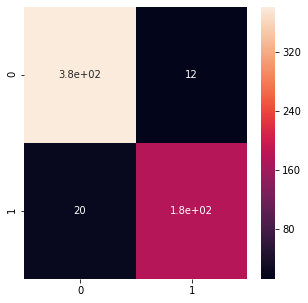

In [ ]:
prediction = model.predict(test_generator)

pred = np.argmax(prediction, axis=1)
#pred = np.asarray(pred).astype('str')
original = np.asarray(test['mask']).astype('int')

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
accuracy = accuracy_score(original, pred)
print(accuracy)

cm = confusion_matrix(original, pred)

report = classification_report(original, pred, labels = [0,1])
print(report)
plt.figure(figsize = (5,5))
sns.heatmap(cm, annot=True);

### As you can see, our ResNet50 classifier model performed quite well, as we had very high Precision, Recall and F1-Scores overall, and a great accuracy score of about 94.58%. When testing it we got 380 True Negatives (No Tumor), 12 False Negatives, 180 True Positives, and 20 False Positives. The model definitely had an easier time identifying negatives than positives, as is evident with the lower recall for positives in 0.90 versus 0.97 for negatives.

> Indented block



# UNet Segmentation Model

In [ ]:
brain_df_diagnosis = brain_df[brain_df['diagnosis'] == 1]
brain_df_diagnosis.shape

(1373, 5)

In [ ]:
# creating test, train and val sets
X_train, X_val = train_test_split(brain_df_diagnosis, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)
print("Train size is {}, valid size is {} & test size is {}".format(len(X_train), len(X_val), len(X_test)))

train_ids = list(X_train.contrast_added_path)
train_diagnosis = list(X_train.mask_path)

val_ids = list(X_val.contrast_added_path)
val_diagnosis= list(X_val.mask_path)

Train size is 1167, valid size is 103 & test size is 103


In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, ids , diagnosis, image_dir = './', batch_size = 16, img_h = 256, img_w = 256, shuffle = True):
        self.ids = ids
        self.diagnosis = diagnosis
        self.image_dir = image_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
    'Get the number of batches per epoch'
        return int(np.floor(len(self.ids)) / self.batch_size)

    def __getitem__(self, index):
    'Generate a batch of data'

        #generate index of batch_size length
        indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

        #get the ImageId corresponding to the indexes created above based on batch size
        list_ids = [self.ids[i] for i in indexes]

        #get the diagnosisId corresponding to the indexes created above based on batch size
        list_diagnosis = [self.diagnosis[i] for i in indexes]


        #generate data for the X(features) and y(label)
        X, y = self.__data_generation(list_ids, list_diagnosis)

        #returning the data
        return X, y

    def on_epoch_end(self):
        'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'

        #getting the array of indices based on the input dataframe
        self.indexes = np.arange(len(self.ids))

        #if shuffle is true, shuffle the indices
        if self.shuffle:
          np.random.shuffle(self.indexes)

    def __data_generation(self, list_ids, list_diagnosis):
        'generate the data corresponding the indexes in a given batch of images'

        # create empty arrays of shape (batch_size,height,width,depth)
        #Depth is 3 for input and depth is taken as 1 for output becasue diagnosis consist only of 1 channel.
        X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
        y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

        #iterate through the dataframe rows, whose size is equal to the batch_size
        for i in range(len(list_ids)):
          #path of the image
          img_path = str(list_ids[i])

          #diagnosis path
          diagnosis_path = str(list_diagnosis[i])

          #reading the original image and the corresponding diagnosis image
          img = io.imread(img_path)
          diagnosis = io.imread(diagnosis_path)

          #resizing and coverting them to array of type float64
          img = cv2.resize(img,(self.img_h,self.img_w))
          img = np.array(img, dtype = np.float64)

          diagnosis = cv2.resize(diagnosis,(self.img_h,self.img_w))
          diagnosis = np.array(diagnosis, dtype = np.float64)

          #standardising
          img -= img.mean()
          img /= img.std()

          diagnosis -= diagnosis.mean()
          diagnosis /= diagnosis.std()

          #Adding image to the empty array
          X[i,] = img

          #expanding the dimnesion of the image from (256,256) to (256,256,1)
          y[i,] = np.expand_dims(diagnosis, axis = 2)

        #normalizing y
        y = (y > 0).astype(int)

        return X, y

train_data = DataGenerator(train_ids, train_diagnosis)
val_data = DataGenerator(val_ids, val_diagnosis)

In [ ]:
def resblock(X, f):
    '''
    function for creating res block
    '''
    X_copy = X  #copy of input

    # main path
    X = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)

    X = Conv2D(f, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)

    # shortcut path
    X_copy = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)

    # Adding the output from main path and short path together
    X = Add()([X, X_copy])
    X = Activation('relu')(X)

    return X

def upsample_concat(x, skip):
    '''
    funtion for upsampling image
    '''
    X = UpSampling2D((2,2))(x)
    merge = Concatenate()([X, skip])

    return merge

In [ ]:
input_shape = (256,256,3)
X_input = Input(input_shape) #iniating tensor of input shape

# Stage 1
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(X_input)
conv_1 = BatchNormalization()(conv_1)
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv_1)
conv_1 = BatchNormalization()(conv_1)
pool_1 = MaxPool2D((2,2))(conv_1)

# stage 2
conv_2 = resblock(pool_1, 32)
pool_2 = MaxPool2D((2,2))(conv_2)

# Stage 3
conv_3 = resblock(pool_2, 64)
pool_3 = MaxPool2D((2,2))(conv_3)

# Stage 4
conv_4 = resblock(pool_3, 128)
pool_4 = MaxPool2D((2,2))(conv_4)

# Stage 5 (bottle neck)
conv_5 = resblock(pool_4, 256)

# Upsample Stage 1
up_1 = upsample_concat(conv_5, conv_4)
up_1 = resblock(up_1, 128)

# Upsample Stage 2
up_2 = upsample_concat(up_1, conv_3)
up_2 = resblock(up_2, 64)

# Upsample Stage 3
up_3 = upsample_concat(up_2, conv_2)
up_3 = resblock(up_3, 32)

# Upsample Stage 4
up_4 = upsample_concat(up_3, conv_1)
up_4 = resblock(up_4, 16)

# final output
out = Conv2D(1, (1,1), kernel_initializer='he_normal', padding='same', activation='sigmoid')(up_4)

seg_model = Model(X_input, out)
seg_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_27 (Conv2D)             (None, 256, 256, 16  448         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_26 (BatchN  (None, 256, 256, 16  64         ['conv2d_27[0][0]']              
 ormalization)                  )                                                           

 conv2d_37 (Conv2D)             (None, 32, 32, 128)  8320        ['max_pooling2d_6[0][0]']        
                                                                                                  
 batch_normalization_35 (BatchN  (None, 32, 32, 128)  512        ['conv2d_36[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_36 (BatchN  (None, 32, 32, 128)  512        ['conv2d_37[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_10 (Add)                   (None, 32, 32, 128)  0           ['batch_normalization_35[0][0]', 
                                                                  'batch_normalization_36[0][0]'] 
          

 batch_normalization_45 (BatchN  (None, 64, 64, 64)  256         ['conv2d_46[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_13 (Add)                   (None, 64, 64, 64)   0           ['batch_normalization_44[0][0]', 
                                                                  'batch_normalization_45[0][0]'] 
                                                                                                  
 activation_27 (Activation)     (None, 64, 64, 64)   0           ['add_13[0][0]']                 
                                                                                                  
 up_sampling2d_6 (UpSampling2D)  (None, 128, 128, 64  0          ['activation_27[0][0]']          
                                )                                                                 
          

# UNet Segmentation Model

In [ ]:
# Defining a custom loss function for the model
from keras.losses import binary_crossentropy

epsilon = 1e-5
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

In [ ]:
# compling model and callbacks functions
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
seg_model.compile(optimizer = adam,
                  loss = focal_tversky,
                  metrics = [tversky]
                 )
#callbacks
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=20
                             )
# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-segModel-weights.hdf5",
                               verbose=1,
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

C:\Users\Allen\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



In [ ]:
h = seg_model.fit(train_data,
                  epochs = 60,
                  validation_data = val_data,
                  callbacks = [checkpointer, earlystopping, reduce_lr]
                 )

Epoch 1/60
72/72 [==============================] - ETA: 0s - loss: 0.8545 - tversky: 0.1883
Epoch 1: val_loss improved from inf to 0.81656, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 400s 6s/step - loss: 0.8545 - tversky: 0.1883 - val_loss: 0.8166 - val_tversky: 0.2365 - lr: 0.0500
Epoch 2/60
72/72 [==============================] - ETA: 0s - loss: 0.5298 - tversky: 0.5660
Epoch 2: val_loss improved from 0.81656 to 0.58300, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 396s 6s/step - loss: 0.5298 - tversky: 0.5660 - val_loss: 0.5830 - val_tversky: 0.5107 - lr: 0.0500
Epoch 3/60
72/72 [==============================] - ETA: 0s - loss: 0.3777 - tversky: 0.7252
Epoch 3: val_loss improved from 0.58300 to 0.51161, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 394s 5s/step - loss: 0.3777 - tversky: 0.7252 - val_loss: 0.5116 - val_tversky: 0.5891 - lr: 0.0500
Epoch 4/

Epoch 28/60
72/72 [==============================] - ETA: 0s - loss: 0.1200 - tversky: 0.9405
Epoch 28: val_loss did not improve from 0.16476
72/72 [==============================] - 397s 6s/step - loss: 0.1200 - tversky: 0.9405 - val_loss: 0.1900 - val_tversky: 0.8900 - lr: 0.0500
Epoch 29/60
72/72 [==============================] - ETA: 0s - loss: 0.1154 - tversky: 0.9436
Epoch 29: val_loss did not improve from 0.16476
72/72 [==============================] - 397s 6s/step - loss: 0.1154 - tversky: 0.9436 - val_loss: 0.1737 - val_tversky: 0.9028 - lr: 0.0500
Epoch 30/60
72/72 [==============================] - ETA: 0s - loss: 0.1152 - tversky: 0.9437 
Epoch 30: val_loss did not improve from 0.16476
72/72 [==============================] - 991s 14s/step - loss: 0.1152 - tversky: 0.9437 - val_loss: 0.2089 - val_tversky: 0.8747 - lr: 0.0500
Epoch 31/60
72/72 [==============================] - ETA: 0s - loss: 0.1125 - tversky: 0.9455
Epoch 31: val_loss did not improve from 0.16476
72/72 [

In [ ]:
# saving model achitecture in json file
seg_model_json = seg_model.to_json()
with open("ResUNet-seg-model.json", "w") as json_file:
    json_file.write(seg_model_json)

# SEGMENTATION MODEL EVALUATION

In [ ]:
h.history.keys()

dict_keys(['loss', 'tversky', 'val_loss', 'val_tversky', 'lr'])

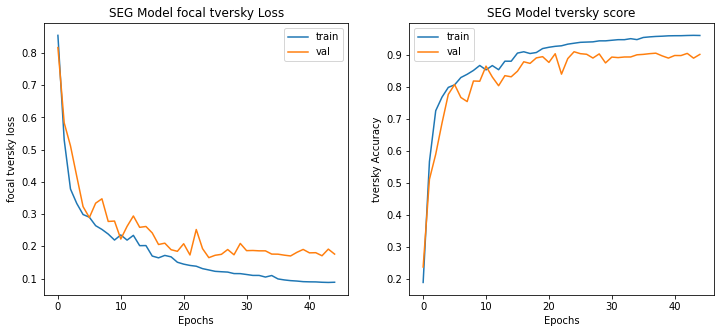

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("SEG Model focal tversky Loss");
plt.ylabel("focal tversky loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['tversky']);
plt.plot(h.history['val_tversky']);
plt.title("SEG Model tversky score");
plt.ylabel("tversky Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [ ]:
test_ids = list(X_test.image_path)
test_mask = list(X_test.mask_path)
test_data = DataGenerator(test_ids, test_mask)
_, tv = seg_model.evaluate(test_data)
print("Segmentation tversky is {:.2f}%".format(tv*100))

6/6 [==============================] - 10s 2s/step - loss: 0.1761 - tversky: 0.9010
Segmentation tversky is 90.10%


The Tversky Index is an asymmetric similarity measure for calculating the similarity between a variant (y_pred) and a prototype (y_true). The parameters of the Tversky index allow for different weights to be given to the prototype and the variant. The visual on the right compares the similarity scores of the model to the ground truth on both the training and test data over the course of 50 epochs. The visual on the left is a graph of the focal Tversky loss scores for the model over the epochs. Focal Tversky loss adds a modulator parameter which allows for the model to be focused toward harder examples, which is why it is particularly useful for this dataset. For the modulating value, we used the same value used by the researchers If the model wasn't told to focus less on easy segmentation tasks (i.e. no tumor), it would be less accurate.

# Visualizing Segmentation Model Outputs

In [ ]:
def prediction(test, model, model_seg):
    '''
    Prediction function which takes dataframe containing ImageID as Input and perform 2 type of prediction on the image
    Initially, image is passed through the classification network which predicts whether the image has defect or not, if the model
    is 99% sure that the image has no defect, then the image is labeled as no-defect, if the model is not sure, it passes the image to the
    segmentation network, it again checks if the image has defect or not, if it has defect, then the type and location of defect is found
    '''
    # empty list to store results
    mask, image_id, has_mask = [], [], []

    #iterating through each image in test data
    for i in test.image_path:

        img = io.imread(i)
        #normalizing
        img = img *1./255.
        #reshaping
        img = cv2.resize(img, (256,256))
        # converting img into array
        img = np.array(img, dtype=np.float64)
        #reshaping the image from 256,256,3 to 1,256,256,3
        img = np.reshape(img, (1,256,256,3))

        #making prediction for tumor in image
        is_defect = model.predict(img)

        #if tumour is not present we append the details of the image to the list
        if np.argmax(is_defect)==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask :)')
            continue

        #Creating a empty array of shape 1,256,256,1
        X = np.empty((1,256,256,3))
        # read the image
        img = io.imread(i)
        #resizing the image and coverting them to array of type float64
        img = cv2.resize(img, (256,256))
        img = np.array(img, dtype=np.float64)

        # standardising the image
        img -= img.mean()
        img /= img.std()
        #converting the shape of image from 256,256,3 to 1,256,256,3
        X[0,] = img

        #make prediction of mask
        predict = model_seg.predict(X)

        # if sum of predicted mask is 0 then there is not tumour
        if predict.round().astype(int).sum()==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
        else:
        #if the sum of pixel values are more than 0, then there is tumour
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)

    return pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})

In [ ]:
# making prediction
df_pred = prediction(test, model, seg_model)
df_pred

1/1 [==============================] - 0s 360ms/step


1/1 [==============================] - 0s 241ms/step


1/1 [==============================] - 0s 168ms/step


,image_path,predicted_mask,has_mask
0,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
1,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
2,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
3,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
4,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
...,...,...,...
585,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
586,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
587,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0
588,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,No mask :),0


In [ ]:
# merging original and prediction df
df_pred = test.merge(df_pred, on='image_path')
df_pred.head(10)

,image_path,mask_path,mask,predicted_mask,has_mask
0,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0
1,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0
2,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0
3,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0
4,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0
5,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,1,"[[[[1.2882465e-06], [4.4469616e-06], [1.765560...",1
6,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,1,"[[[[1.8696537e-06], [4.850988e-06], [1.9636866...",1
7,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,1,"[[[[2.682509e-06], [7.2555995e-06], [5.1512666...",1
8,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,1,"[[[[1.5521414e-06], [4.3624386e-06], [2.027079...",1
9,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,brain_tumor_data/lgg-mri-segmentation/kaggle_3...,0,No mask :),0


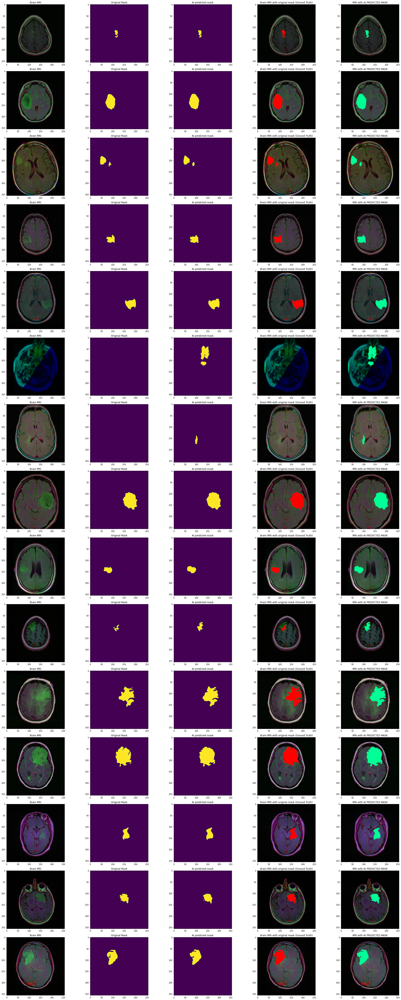

In [ ]:
#visualizing prediction
count = 0
fig, axs = plt.subplots(15,5, figsize=(30,70))

for i in range(len(df_pred)):
    if df_pred.has_mask[i]==1 and count<15:
        #read mri images
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].imshow(img)
        axs[count][0].title.set_text('Brain MRI')

        #read original mask
        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].imshow(mask)
        axs[count][1].title.set_text('Original Mask')

        #read predicted mask
        pred = np.array(df_pred.predicted_mask[i]).squeeze().round()
        axs[count][2].imshow(pred)
        axs[count][2].title.set_text('AI predicted mask')

        #overlay original mask with MRI
        img[mask==255] = (255,0,0)
        axs[count][3].imshow(img)
        axs[count][3].title.set_text('Brain MRI with original mask (Ground Truth)')

        #overlay predicted mask and MRI
        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[pred==1] = (0,255,150)
        axs[count][4].imshow(img_)
        axs[count][4].title.set_text('MRI with AI PREDICTED MASK')

        count +=1
    if (count==15):
        break

fig.tight_layout()

This visualization is reflective of the accuracy score seen earlier (90.10%). The results show that the model does pretty well at predicting the masks, though it is a bit sensitive. This is seen in the 6th and 7th rows of the visualization, where the the model predicted tumors where there were none. For the results that correctly predicted a tumor, the masks did well, with the AI predicted masks looking nearly identical to the original masks, except for differences in small details such as divots and breaks.

# Conclusion

In conclusion, we were able to use machine learning (specifically, neural networks like ResNet50 and U-Net Segmentation) models to detect tumors in a human brain. Computer vision and brain imaging can be an extremely helpful resource in the medical field. It could reduce human error and provide a crucical second opinion to oncologists when making decisions regarding treatment plans for cancer patients, and thus lead to many lives being saved.